In [1]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import time
import datetime

In [2]:
index_choice = 'sp500'

In [14]:
SMALL_SIZE = 6
MEDIUM_SIZE = 8
BIGGER_SIZE = 10

plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)

In [4]:
path = os.path.join("output", f"{index_choice}", "download", "*2019-01-02_2020-09-30.csv")
stocks=glob.glob(path)

stock_list= []
for file in stocks:
    head, tail = os.path.split(file)
    stock_name=tail.split("_") [0]
    stock_list.append(stock_name)
    #print(stock_name)

series= []
for stock in stock_list:
    path= os.path.join(f"output", f"{index_choice}", "download", f"{stock}_2019-01-02_2020-09-30.csv")
    df = pd.read_csv(path, encoding="UTF8")
    def rename(col):
        if col.startswith("Unnamed: "):
            return "date"
        else:
            return col
    df.columns = [rename(col) for col in df.columns]
    df["datetime"] = df["date"].apply(lambda s: datetime.datetime.strptime(s, "%Y-%m-%d"))
    series.append(df)

In [5]:
for stock in series:
    stock["values"]=(stock["open"]-stock["open"].min())/(stock["open"].max()-stock["open"].min())

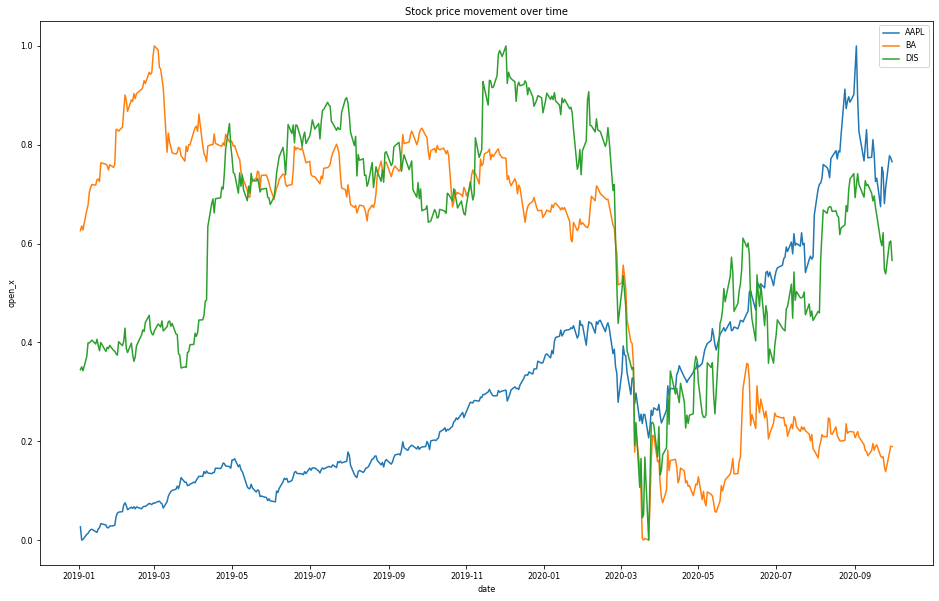

In [15]:
fig = plt.figure(figsize=(16,10))
top3=["AAPL","BA","DIS"]
for index in range(len(series)):
    if series[index]["ticker"].values[0] in top3:
        plt.plot("datetime", "values", label = stock_list[index], data = series[index])
plt.xlabel('date')
plt.ylabel('open_x')
plt.title('Stock price movement over time')
plt.legend()
plt.show()

In [7]:
file_path = os.path.join("temp",f"{index_choice}",f"{index_choice}_final.csv")
final_df = pd.read_csv(file_path)
final_df["datetime"] = final_df["date"].apply(lambda s: datetime.datetime.strptime(s, "%Y-%m-%d"))

In [8]:
sector_list = pd.Series(data=final_df["sector"]).unique()
print(sector_list)

['Industrials' 'Technology' 'Consumer Cyclical' 'Healthcare'
 'Consumer Defensive' 'Utilities' 'Financial Services' 'Real Estate'
 'Basic Materials' 'Energy' 'Communication Services' nan]


In [27]:
df_group = final_df.groupby(by="sector")

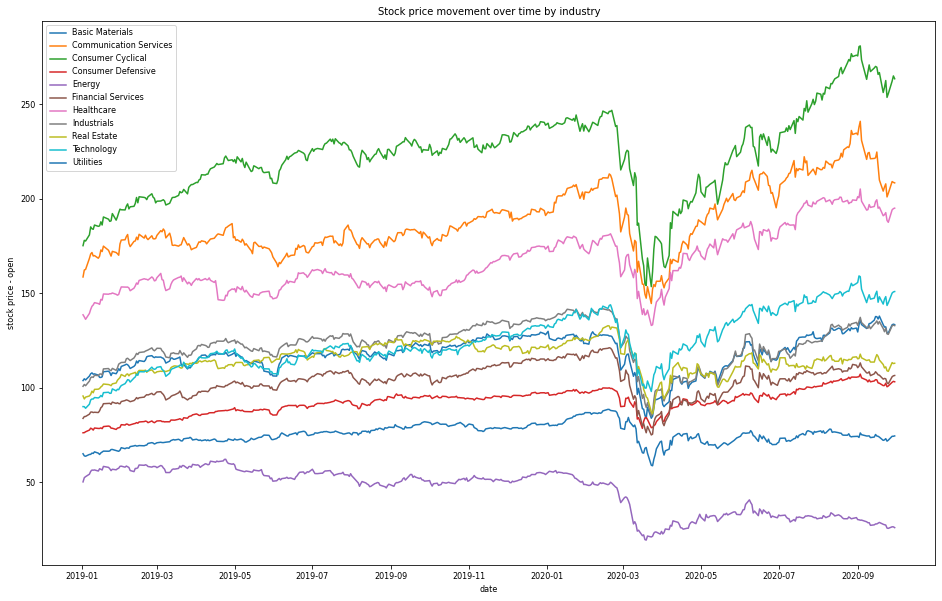

In [28]:
fig = plt.figure(figsize=(16,10))
for sector, df in df_group:
    df_group_date = df.groupby(by="datetime").mean("open_x").reset_index()
    plt.plot("datetime", "open_x",label =sector, data = df_group_date)
plt.xlabel('date')
plt.ylabel('stock price - open')
plt.title('Stock price movement over time by industry')
plt.legend()
plt.show()


In [11]:
covid_df = pd.read_csv("world_covid_data.csv",encoding="UTF8")
covid_df.head()

covid_df["datetime"] = covid_df["date"].apply(lambda s: datetime.datetime.strptime(s, "%d/%m/%Y"))

covid_usa = covid_df.loc[covid_df["iso_code"] == "USA"]
covid_usa.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 279 entries, 45092 to 45370
Data columns (total 42 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   iso_code                         279 non-null    object        
 1   continent                        279 non-null    object        
 2   location                         279 non-null    object        
 3   date                             279 non-null    object        
 4   total_cases                      279 non-null    float64       
 5   new_cases                        279 non-null    float64       
 6   new_cases_smoothed               273 non-null    float64       
 7   total_deaths                     279 non-null    float64       
 8   new_deaths                       279 non-null    float64       
 9   new_deaths_smoothed              273 non-null    float64       
 10  total_cases_per_million          279 non-null    float64

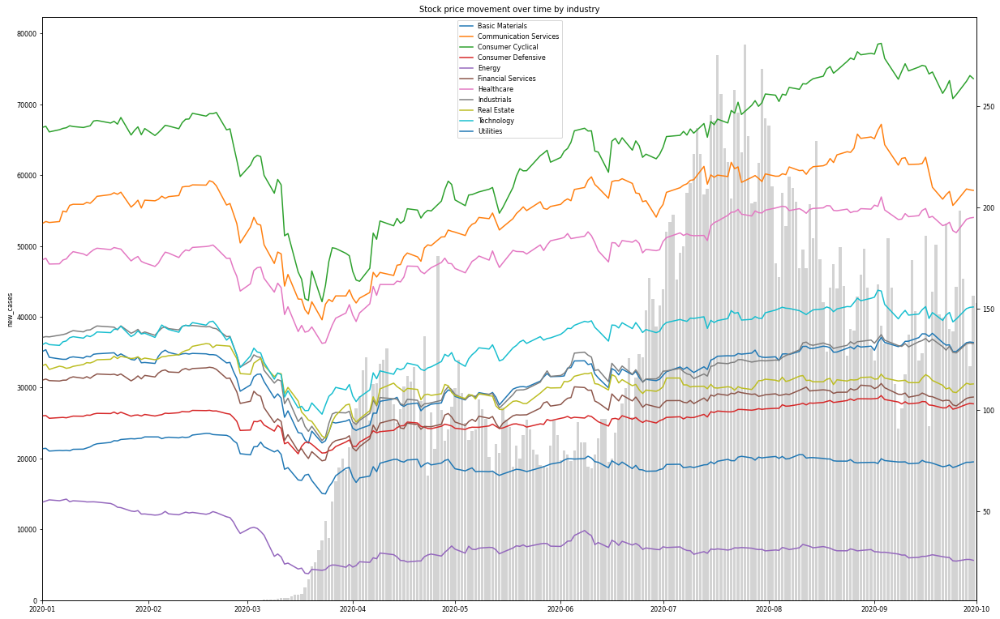

In [16]:
fig = plt.figure(figsize=(16,10))
a1 = fig.add_axes([0,0,1,1])
x = covid_usa["datetime"]
a1.bar("datetime", "new_cases",color="lightgrey", data = covid_usa)
a1.set_ylabel('new_cases')
a2 = a1.twinx()
for sector, df in df_group:
    df_group_date = df.groupby(by="datetime").mean("open_x").reset_index()
    a2.plot("datetime", "open_x", label=sector, data = df_group_date)
plt.title('Stock price movement over time by industry')
plt.legend()
plt.xlim("2020-01", "2020-10")
plt.show()

In [35]:
plt.scatter(covid_usa.new_cases, final_df.open_x)
plt.xlim("2020-01", "2020-10")


ValueError: x and y must be the same size

In [42]:
covid_stock_df = final_df.merge(covid_usa, how = "outer", left_on= "datetime", right_on="datetime")
covid_stock_df.describe()

,open_x,high,low,close,adjclose,volume_x,fullTimeEmployees,maxAge,previousClose,regularMarketOpen,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,219870.000000,219870.000000,219870.000000,219870.000000,219870.000000,2.198700e+05,2.182220e+05,219545.0,219545.000000,219545.000000,...,9.530700e+04,9.530700e+04,9.530700e+04,9.530700e+04,9.530700e+04,95307.0,0.0,95307.00,95307.00,9.530700e+04
mean,132.848928,134.529839,131.155255,132.911631,131.245989,4.796437e+06,5.131172e+04,1.0,154.637412,155.835060,...,5.422545e+04,1.200000e+00,1.510890e+02,1.079000e+01,1.910000e+01,24.6,NaN,2.77,78.86,9.240000e-01
std,231.272536,234.443436,228.269986,231.447745,231.382129,1.146797e+07,1.236815e+05,0.0,293.980529,300.204786,...,7.275996e-12,2.220458e-16,5.684372e-14,5.329098e-15,3.552732e-15,0.0,NaN,0.00,0.00,4.440915e-16
min,3.220000,3.290000,3.020000,3.120000,3.120000,0.000000e+00,1.100000e+02,1.0,3.980000,4.010000,...,5.422545e+04,1.200000e+00,1.510890e+02,1.079000e+01,1.910000e+01,24.6,NaN,2.77,78.86,9.240000e-01
25%,47.230000,47.889999,46.540001,47.250000,45.878201,1.014300e+06,8.717000e+03,1.0,41.570000,42.210000,...,5.422545e+04,1.200000e+00,1.510890e+02,1.079000e+01,1.910000e+01,24.6,NaN,2.77,78.86,9.240000e-01
50%,84.529999,85.533360,83.489998,84.550003,82.661015,2.009700e+06,1.860000e+04,1.0,91.260000,91.940000,...,5.422545e+04,1.200000e+00,1.510890e+02,1.079000e+01,1.910000e+01,24.6,NaN,2.77,78.86,9.240000e-01
75%,145.300003,147.000000,143.537495,145.380005,143.350006,4.421350e+06,5.110000e+04,1.0,167.530000,169.290000,...,5.422545e+04,1.200000e+00,1.510890e+02,1.079000e+01,1.910000e+01,24.6,NaN,2.77,78.86,9.240000e-01
max,4295.109863,4318.000000,4198.000000,4310.089844,4310.089844,4.286171e+08,2.200000e+06,1.0,4251.180000,4450.000000,...,5.422545e+04,1.200000e+00,1.510890e+02,1.079000e+01,1.910000e+01,24.6,NaN,2.77,78.86,9.240000e-01


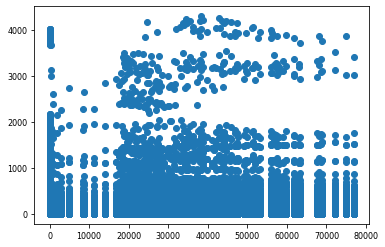

In [46]:
plt.scatter("new_cases", "open_x", data=covid_stock_df, cmap="sector")

,date,open_x,high,low,close,adjclose,volume_x,ticker,zip,sector,...,category,fiveYearAverageReturn,regularMarketPrice,logo_url,address2,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,datetime
0,2019-01-02,31.459999,32.650002,31.049999,32.480000,31.963160,5229500.0,AAL,76155,Industrials,...,NaN,NaN,12.75,https://logo.clearbit.com/aa.com,NaN,NaN,NaN,NaN,NaN,2019-01-02
1,2019-01-03,31.690001,31.850000,28.809999,30.059999,29.581665,16822000.0,AAL,76155,Industrials,...,NaN,NaN,12.75,https://logo.clearbit.com/aa.com,NaN,NaN,NaN,NaN,NaN,2019-01-03
2,2019-01-04,30.440001,32.090000,30.400000,32.040001,31.530161,9369600.0,AAL,76155,Industrials,...,NaN,NaN,12.75,https://logo.clearbit.com/aa.com,NaN,NaN,NaN,NaN,NaN,2019-01-04
3,2019-01-07,31.990000,33.480000,31.240000,32.950001,32.425678,8010700.0,AAL,76155,Industrials,...,NaN,NaN,12.75,https://logo.clearbit.com/aa.com,NaN,NaN,NaN,NaN,NaN,2019-01-07
4,2019-01-08,33.360001,33.650002,32.200001,32.419998,31.904110,7107700.0,AAL,76155,Industrials,...,NaN,NaN,12.75,https://logo.clearbit.com/aa.com,NaN,NaN,NaN,NaN,NaN,2019-01-08
